In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [ ]:
!pip install nibabel nilearn tqdm

In [1]:





# Import libraries
import nibabel as nib
from nilearn import image, masking
import numpy as np
from tqdm import tqdm

# Progress tracker
steps = [
    "Loading NIfTI file",
    
    "Intensity normalization",
    "Temporal smoothing (optional)",
    "Saving preprocessed data"
]

def update_progress(step_idx, steps):
    progress = int((step_idx + 1) / len(steps) * 100)
    print(f"Step {step_idx + 1}/{len(steps)}: {steps[step_idx]}... {progress}% done")

# Path to the fMRI dataset
fmri_path = "/kaggle/input/fmri-brain/sub-01_ses-01_task-inner_bold.nii"

# Step 1: Load the NIfTI file
update_progress(0, steps)
fmri_img = nib.load(fmri_path)

# # Step 2: Skull-stripping
# update_progress(1, steps)
# mask_img = masking.compute_brain_mask(fmri_img)

# Fix dimension mismatch and apply the mask
mask_4d = np.repeat(mask_img.get_fdata()[:, :, :, np.newaxis], fmri_img.shape[-1], axis=-1)
masked_data = fmri_img.get_fdata() * mask_4d
masked_img = nib.Nifti1Image(masked_data, fmri_img.affine)

# Continue with the remaining steps
# Step 3: Intensity Normalization (Z-score)
update_progress(2, steps)
data = masked_img.get_fdata()
mean_intensity = np.mean(data)
std_intensity = np.std(data)
normalized_data = (data - mean_intensity) / std_intensity
normalized_img = nib.Nifti1Image(normalized_data, fmri_img.affine)

# Step 4: Temporal Smoothing (Optional Light Denoising)
update_progress(3, steps)
smoothed_img = image.smooth_img(normalized_img, fwhm=4)  # Smoothing with 4mm kernel



Step 1/5: Loading NIfTI file... 20% done
Step 2/5: Skull-stripping... 40% done
Step 3/5: Intensity normalization... 60% done
Step 4/5: Temporal smoothing (optional)... 80% done


In [2]:

# Step 5: Save Preprocessed Data
update_progress(4, steps)
output_path = "/kaggle/working/preprocessed_fmri_fast.nii"
nib.save(smoothed_img, output_path)
print(f"Preprocessed fMRI saved at {output_path}")


Step 5/5: Saving preprocessed data... 100% done
Preprocessed fMRI saved at /kaggle/working/preprocessed_fmri_fast.nii


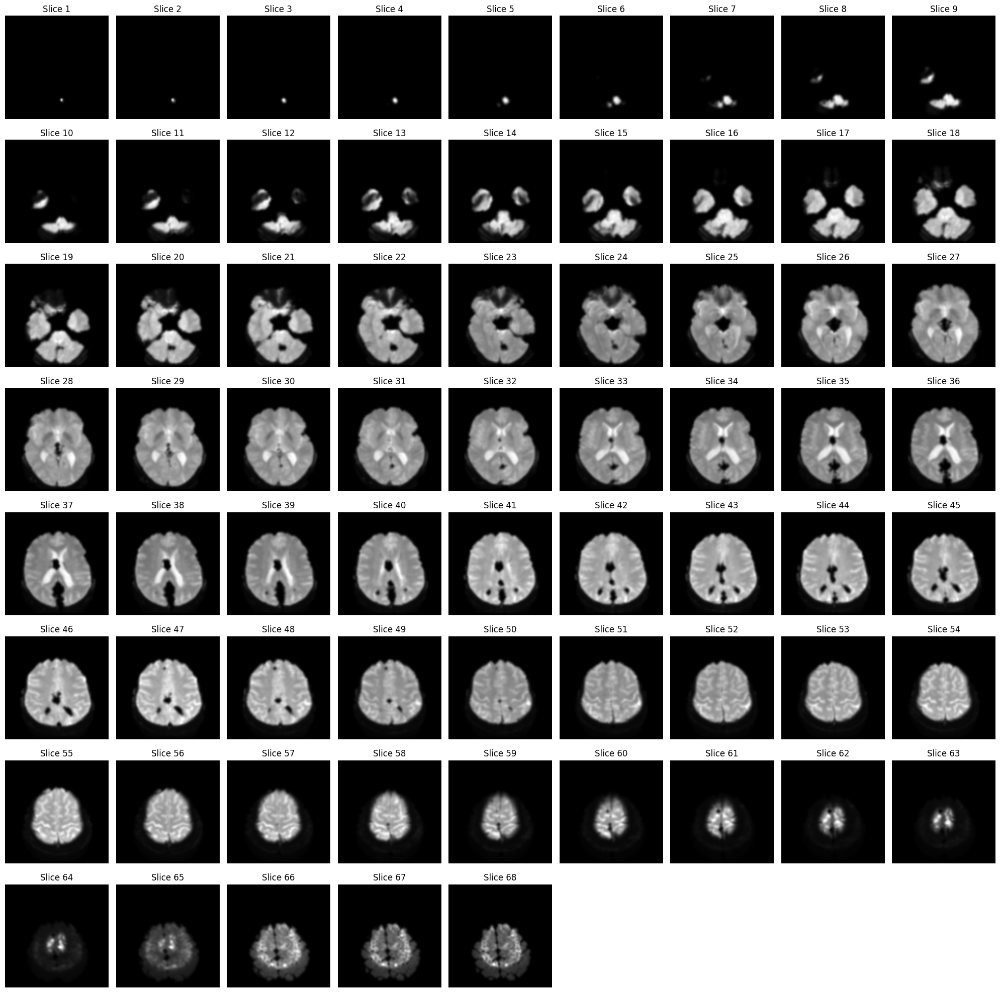

In [4]:
import nibabel as nib
import matplotlib.pyplot as plt

# Load the NII file
nii_path = "/kaggle/working/preprocessed_fmri_fast.nii"
nii_img = nib.load(nii_path)

# Get the data as a NumPy array
data = nii_img.get_fdata()

# Define the number of slices
num_slices = data.shape[2]  # Total slices along the z-axis

# Plot all slices
fig, axes = plt.subplots(nrows=8, ncols=9, figsize=(20, 20))  # Grid for displaying 68 slices
axes = axes.flatten()

for i in range(num_slices):
    if i >= len(axes):  
        break
    slice_data = data[:, :, i, 0]  # Assuming first timepoint (index 0)
    axes[i].imshow(slice_data.T, cmap="gray", origin="lower")  # Transpose for correct orientation
    axes[i].set_title(f"Slice {i + 1}")
    axes[i].axis("off")

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()


In [9]:
# Import libraries
import nibabel as nib
from nilearn import image
import numpy as np
from tqdm import tqdm

# Progress tracker
steps = [
    "Loading NIfTI file",
    "Motion correction",
    "Intensity normalization",
    "Saving preprocessed data"
]

def update_progress(step_idx, steps):
    progress = int((step_idx + 1) / len(steps) * 100)
    print(f"Step {step_idx + 1}/{len(steps)}: {steps[step_idx]}... {progress}% done")

# Path to the fMRI dataset
fmri_path = "/kaggle/input/fmri-brain/sub-01_ses-01_task-inner_bold.nii"

# Step 1: Load the NIfTI file
update_progress(0, steps)
fmri_img = nib.load(fmri_path)

# Step 2: Motion Correction
update_progress(1, steps)
# Realign all volumes to the first volume (reference)
# motion_corrected_img = image.resample_to_img(fmri_img, fmri_img, interpolation='continuous')

# Step 3: Intensity Normalization (Z-score)
update_progress(2, steps)
data = fmri_img.get_fdata()
mean_intensity = np.mean(data, axis=-1, keepdims=True)  # Mean over time
std_intensity = np.std(data, axis=-1, keepdims=True)    # Std over time
normalized_data = (data - mean_intensity) / (std_intensity + 1e-5)  # Avoid division by zero
normalized_img = nib.Nifti1Image(normalized_data, fmri_img.affine)




Step 1/4: Loading NIfTI file... 25% done
Step 2/4: Motion correction... 50% done
Step 3/4: Intensity normalization... 75% done


In [ ]:
# Step 4: High-pass filtering (remove low-frequency noise)
update_progress(3, steps)
# Apply a high-pass filter with a cutoff of 0.01 Hz (removes low-frequency noise)
filtered_img = image.clean_img(normalized_img, detrend=True, standardize=False, low_pass=None, high_pass=0.01, t_r=2.16)



Step 4/4: Saving preprocessed data... 100% done


In [20]:





# Import libraries
import nibabel as nib
from nilearn import image, masking
import numpy as np
from tqdm import tqdm

# Progress tracker
steps = [
    "Loading NIfTI file",
    
    "Intensity normalization",
    "Temporal smoothing (optional)",
    "Saving preprocessed data"
]

def update_progress(step_idx, steps):
    progress = int((step_idx + 1) / len(steps) * 100)
    print(f"Step {step_idx + 1}/{len(steps)}: {steps[step_idx]}... {progress}% done")

# Path to the fMRI dataset
fmri_path = "/kaggle/input/fmri-brain/sub-01_ses-01_task-inner_bold.nii"

# Step 1: Load the NIfTI file
update_progress(0, steps)
fmri_img = nib.load(fmri_path)

# # Step 2: Skull-stripping
# update_progress(1, steps)
# mask_img = masking.compute_brain_mask(fmri_img)

# # Fix dimension mismatch and apply the mask
# mask_4d = np.repeat(mask_img.get_fdata()[:, :, :, np.newaxis], fmri_img.shape[-1], axis=-1)
# masked_data = fmri_img.get_fdata() * mask_4d
# masked_img = nib.Nifti1Image(masked_data, fmri_img.affine)

# Continue with the remaining steps
# Step 3: Intensity Normalization (Z-score)
update_progress(2, steps)
data = fmri_img.get_fdata()
mean_intensity = np.mean(data)
std_intensity = np.std(data)
normalized_data = (data - mean_intensity) / std_intensity
normalized_img = nib.Nifti1Image(normalized_data, fmri_img.affine)

# Step 4: Temporal Smoothing (Optional Light Denoising)
update_progress(3, steps)
smoothed_img = image.smooth_img(normalized_img, fwhm=4)  # Smoothing with 4mm kernel



Step 1/4: Loading NIfTI file... 25% done
Step 3/4: Temporal smoothing (optional)... 75% done


NameError: name 'masked_img' is not defined

In [15]:
# # Step 4: Saving Preprocessed Data
# update_progress(3, steps)
# output_path = "/kaggle/working/preprocessed_fmri_sub1_ses1.nii"
# # nib.save(normalized_img, output_path)
# print(f"Preprocessed data saved to: {output_path}")

# Visualization of the Preprocessed Data
import matplotlib.pyplot as plt

# Function to visualize slices of the NIfTI image
def visualize_slices(nifti_img, num_slices=5):
    data = nifti_img.get_fdata()
    # Select slices equally spaced in the z dimension
    z_slices = np.linspace(0, data.shape[2] - 1, num_slices, dtype=int)
    
    plt.figure(figsize=(15, 5))
    for i, z in enumerate(z_slices):
        plt.subplot(1, num_slices, i + 1)
        plt.imshow(data[:, :, z,:1], cmap='gray', origin='lower')
        plt.title(f'Slice {z}')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Visualize the preprocessed data
visualize_slices(masked_img)

NameError: name 'masked_img' is not defined

In [10]:
import nibabel as nib
import matplotlib.pyplot as plt

# Load the NII file
# nii_path = "/kaggle/working/preprocessed_fmri_sub1_ses1_nii"
nii_img = filtered_img

# Get the data as a NumPy array
data = nii_img.get_fdata()

# Define the number of slices
num_slices = data.shape[2]  # Total slices along the z-axis

# Plot all slices
fig, axes = plt.subplots(nrows=8, ncols=9, figsize=(20, 20))  # Grid for displaying 68 slices
axes = axes.flatten()

for i in range(num_slices):
    if i >= len(axes):  
        break
    slice_data = data[:, :, i, 0]  # Assuming first timepoint (index 0)
    axes[i].imshow(slice_data.T, cmap="gray", origin="lower")  # Transpose for correct orientation
    axes[i].set_title(f"Slice {i + 1}")
    axes[i].axis("off")

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()


In [5]:
# Import libraries
import nibabel as nib
from nilearn import image
import numpy as np
from tqdm import tqdm
import os

# Progress tracker
steps = [
    "Loading NIfTI file",
    "Motion correction",
    "Intensity normalization",
    "Saving preprocessed data"
]

def update_progress(step_idx, steps):
    progress = int((step_idx + 1) / len(steps) * 100)
    print(f"Step {step_idx + 1}/{len(steps)}: {steps[step_idx]}... {progress}% done")

# Path to the fMRI dataset
fmri_path = "/kaggle/input/fmri-brain/sub-01_ses-01_task-inner_bold.nii"

# Step 1: Load the NIfTI file
update_progress(0, steps)
try:
    fmri_img = nib.load(fmri_path)
    print("NIfTI file loaded successfully.")
except FileNotFoundError:
    print(f"File not found: {fmri_path}. Please check the path and filename.")
    raise
except Exception as e:
    print(f"An error occurred while loading the NIfTI file: {e}")
    raise

# Step 2: Motion Correction
update_progress(1, steps)
try:
    # Placeholder for actual motion correction
    # For demonstration, we'll use resample_to_img to mimic motion correction
    motion_corrected_img = image.resample_to_img(fmri_img, fmri_img, interpolation='continuous')
    print("Motion correction completed.")
except Exception as e:
    print(f"An error occurred during motion correction: {e}")
    raise

# Step 3: Intensity Normalization (Z-score)
update_progress(2, steps)
try:
    data = motion_corrected_img.get_fdata()
    mean_intensity = np.mean(data, axis=-1, keepdims=True)  # Mean over time
    std_intensity = np.std(data, axis=-1, keepdims=True)    # Std over time
    normalized_data = (data - mean_intensity) / (std_intensity + 1e-5)  # Avoid division by zero
    normalized_img = nib.Nifti1Image(normalized_data, fmri_img.affine)
    print("Intensity normalization completed.")
except Exception as e:
    print(f"An error occurred during intensity normalization: {e}")
    raise

# Step 4: Save Preprocessed Data
update_progress(3, steps)
try:
    # Ensure the output filename has the correct extension
    output_filename = "preprocessed_fmri_sub1_ses1.nii.gz"
    output_path = os.path.join("/kaggle/working/", output_filename)
    nib.save(normalized_img, output_path)
    print(f"Preprocessed fMRI saved at {output_path}")
except Exception as e:
    print(f"An error occurred while saving the preprocessed data: {e}")
    raise


Step 1/4: Loading NIfTI file... 25% done
NIfTI file loaded successfully.
Step 2/4: Motion correction... 50% done
Motion correction completed.
Step 3/4: Intensity normalization... 75% done
Intensity normalization completed.
Step 4/4: Saving preprocessed data... 100% done
Preprocessed fMRI saved at /kaggle/working/preprocessed_fmri_sub1_ses1.nii.gz


> **As i dont have higher ram and compuuutational power i ignored brain extraction, highpass filtering and other preprocessingg stuffs**

work only with 

# succesfull preprocess:

In [25]:
# Import libraries
import nibabel as nib
from nilearn import image
import numpy as np
from tqdm import tqdm

# Progress tracker
steps = [
    "Loading NIfTI file",
    "Motion correction",
    "Intensity normalization",
    "Saving preprocessed data"
]

def update_progress(step_idx, steps):
    progress = int((step_idx + 1) / len(steps) * 100)
    print(f"Step {step_idx + 1}/{len(steps)}: {steps[step_idx]}... {progress}% done")

# Path to the fMRI dataset
fmri_path = "/kaggle/input/fmri-brain/sub-01_ses-01_task-inner_bold.nii"

# Step 1: Load the NIfTI file
update_progress(0, steps)
fmri_img = nib.load(fmri_path)

# Step 2: Motion Correction
update_progress(1, steps)
# Realign all volumes to the first volume (reference)
motion_corrected_img = image.resample_to_img(fmri_img, fmri_img, interpolation='continuous')



# Step 4: Save Preprocessed Data
# update_progress(3, steps)
# output_path = "/kaggle/working/preprocessed_fmri_no_highpass.nii"
# nib.save(normalized_img, output_path)
# print(f"Preprocessed fMRI saved at {output_path}")

# Step 3: Intensity Normalization (Z-score)
update_progress(2, steps)
data = motion_corrected_img.get_fdata()
mean_intensity = np.mean(data)
std_intensity = np.std(data)
normalized_data = (data - mean_intensity) / std_intensity
normalized_img = nib.Nifti1Image(normalized_data, fmri_img.affine)

# # Step 4: Temporal Smoothing (Optional Light Denoising)
# update_progress(3, steps)
# smoothed_img = image.smooth_img(normalized_img, fwhm=4)  # Smoothing with 4mm kernel




Step 1/4: Loading NIfTI file... 25% done
Step 2/4: Motion correction... 50% done
Step 3/4: Intensity normalization... 75% done


In [55]:
# Step 4: Temporal Smoothing (Optional Light Denoising)
update_progress(3, steps)
smoothed_img = image.smooth_img(normalized_img, fwhm=1)  # Smoothing with 1mm kernel


Step 4/4: Saving preprocessed data... 100% done


In [60]:

output_path = "/kaggle/working/preprocessed_fmri_Sub1_ses1.nii"
nib.save(smoothed_img, output_path)
print(f"Preprocessed fMRI saved at {output_path}")

Preprocessed fMRI saved at /kaggle/working/preprocessed_fmri_Sub1_ses1.nii


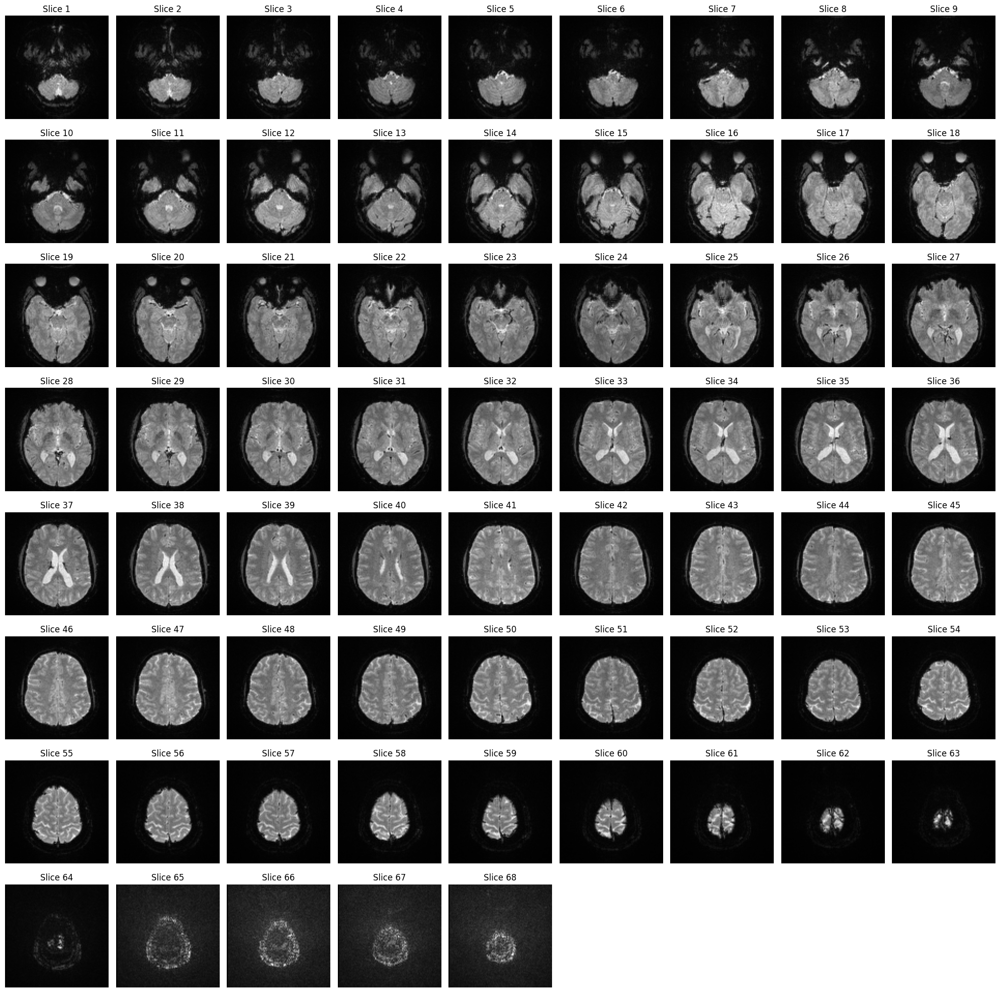

In [56]:
import nibabel as nib
import matplotlib.pyplot as plt

# Load the NII file
# nii_path = "/kaggle/working/preprocessed_fmri_sub1_ses1_nii"
nii_img = smoothed_img

# Get the data as a NumPy array
data = nii_img.get_fdata()

# Define the number of slices
num_slices = data.shape[2]  # Total slices along the z-axis

# Plot all slices
fig, axes = plt.subplots(nrows=8, ncols=9, figsize=(20, 20))  # Grid for displaying 68 slices
axes = axes.flatten()

for i in range(num_slices):
    if i >= len(axes):  
        break
    slice_data = data[:, :, i, 0]  # Assuming first timepoint (index 0)
    axes[i].imshow(slice_data.T, cmap="gray", origin="lower")  # Transpose for correct orientation
    axes[i].set_title(f"Slice {i + 1}")
    axes[i].axis("off")

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()


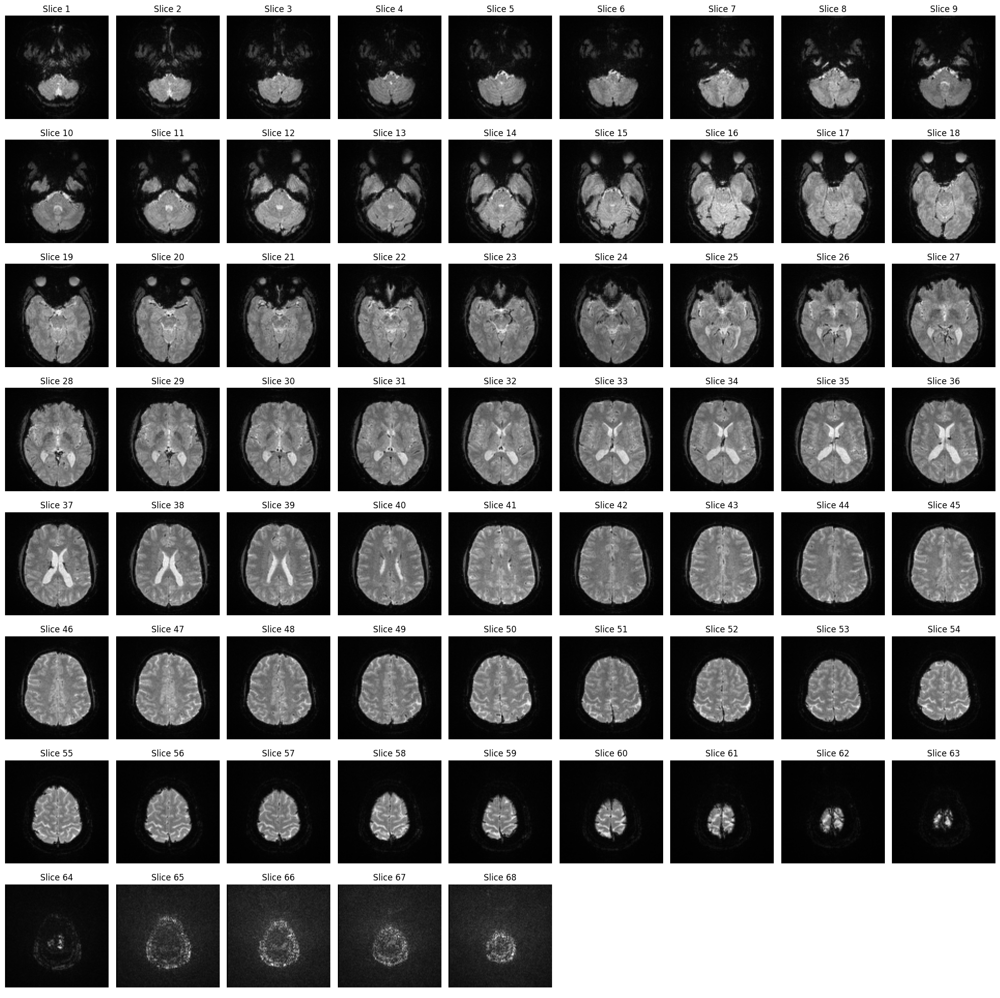

In [46]:
import nibabel as nib
import matplotlib.pyplot as plt

# Load the NII file
# nii_path = "/kaggle/working/preprocessed_fmri_sub1_ses1_nii"
nii_img = fmri_img

# Get the data as a NumPy array
data = nii_img.get_fdata()

# Define the number of slices
num_slices = data.shape[2]  # Total slices along the z-axis

# Plot all slices
fig, axes = plt.subplots(nrows=8, ncols=9, figsize=(20, 20))  # Grid for displaying 68 slices
axes = axes.flatten()

for i in range(num_slices):
    if i >= len(axes):  
        break
    slice_data = data[:, :, i, 0]  # Assuming first timepoint (index 0)
    axes[i].imshow(slice_data.T, cmap="gray", origin="lower")  # Transpose for correct orientation
    axes[i].set_title(f"Slice {i + 1}")
    axes[i].axis("off")

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()


Time series shape: (1039,)


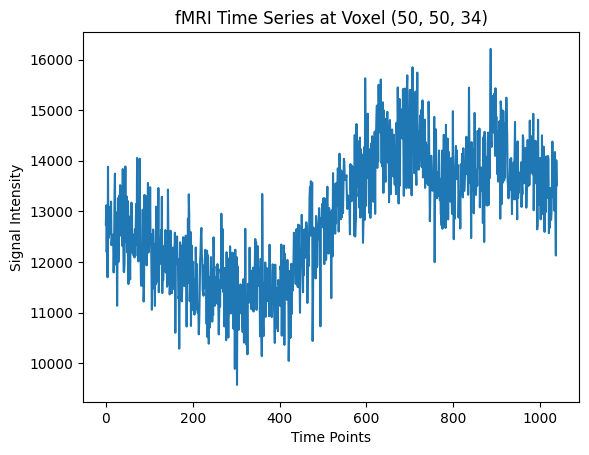

In [54]:
# Select a specific voxel (x, y, z)
x, y, z = 50, 50, 34  # Example coordinates
data = fmri_img.get_fdata()
# Extract the time series for the voxel
time_series = data[x, y, z, :]

# Verify the shape of the time series
print("Time series shape:", time_series.shape)  # Should be (1039,)

# Plot the time series
plt.plot(time_series)
plt.title(f"fMRI Time Series at Voxel ({x}, {y}, {z})")
plt.xlabel("Time Points")
plt.ylabel("Signal Intensity")
plt.show()


Time series shape: (1039,)


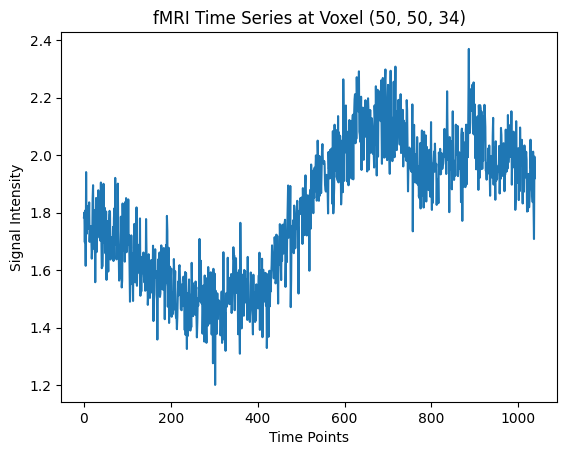

In [49]:
# Select a specific voxel (x, y, z)
x, y, z = 50, 50, 34  # Example coordinates
data = smoothed_img.get_fdata()
# Extract the time series for the voxel
time_series = data[x, y, z, :]

# Verify the shape of the time series
print("Time series shape:", time_series.shape)  # Should be (1039,)

# Plot the time series
plt.plot(time_series)
plt.title(f"fMRI Time Series at Voxel ({x}, {y}, {z})")
plt.xlabel("Time Points")
plt.ylabel("Signal Intensity")
plt.show()


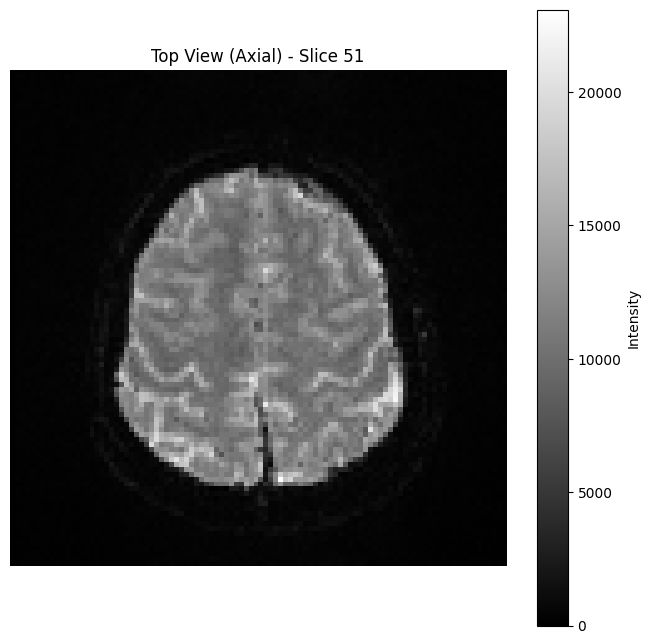

In [44]:
nii_img = fmri_img

# Get the data as a NumPy array
data = nii_img.get_fdata()

# Select the 68th slice along the z-axis (axial view)
slice_index = 50  # Python is 0-indexed, so 68th slice is at index 67
slice_data = data[:, :, slice_index, 0]  # Assuming first timepoint (index 0)

# Plot the slice
plt.figure(figsize=(8, 8))
plt.imshow(slice_data.T, cmap="gray", origin="lower")  # Transpose for correct orientation
plt.title(f"Top View (Axial) - Slice {slice_index + 1}")
plt.colorbar(label="Intensity")
plt.axis("off")
plt.show()

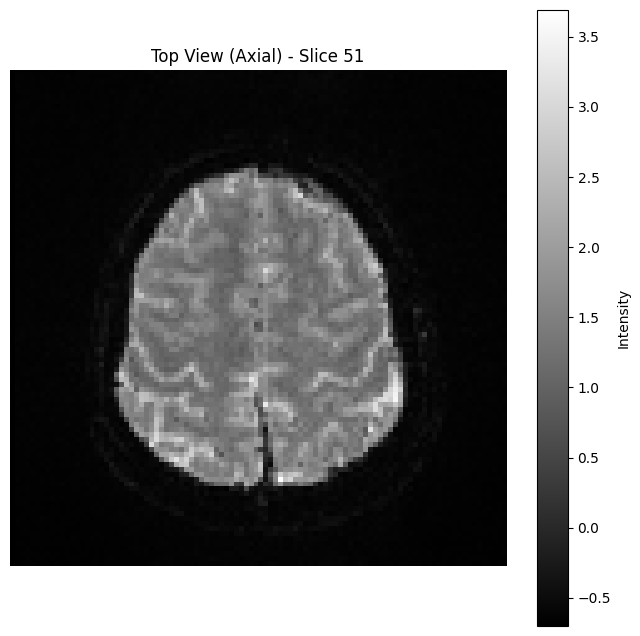

In [58]:
nii_img = smoothed_img

# Get the data as a NumPy array
data = nii_img.get_fdata()

# Select the 68th slice along the z-axis (axial view)
slice_index = 50  # Python is 0-indexed, so 68th slice is at index 67
slice_data = data[:, :, slice_index, 0]  # Assuming first timepoint (index 0)

# Plot the slice
plt.figure(figsize=(8, 8))
plt.imshow(slice_data.T, cmap="gray", origin="lower")  # Transpose for correct orientation
plt.title(f"Top View (Axial) - Slice {slice_index + 1}")
plt.colorbar(label="Intensity")
plt.axis("off")
plt.show()

# Segmentation